In [1]:
import torch
from torchvision import transforms
from transformers import Swinv2Model, Swinv2Config, AutoModelForImageClassification, AutoImageProcessor 
from PIL import Image
from tqdm import tqdm
import pandas as pd
import plotly.express as px

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import json

from concurrent.futures import ThreadPoolExecutor

/projectnb/herbdl/workspaces/mvoong/venvs/herb-cluster/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [14]:
def build_val_dict(file_paths):
    # return dictionary with image paths as keys and image captions (family + scientific name) as  value 
    
    path_dict = {}
    # open the file and reach each line as a JSON object 
    with open(file_paths, 'r') as f:
        for line in f:
            # parse each line as a JSON object 
            obj = json.loads(line.strip()) 
            path_dict[obj["filename"]] = obj["family"] + ' ' + obj["scientific_name"] 
    return path_dict 

In [15]:
# checkpoint for entire kaggle 2022 dataset:
#CHECKPOINT_PATH = '/projectnb/herbdl/workspaces/faridkar/herbdl/finetuning/output/SWIN/kaggle22/checkpoint-139125'

# checkpoint for asteraceae family:
CHECKPOINT_PATH = '/projectnb/herbdl/workspaces/faridkar/herbdl/finetuning/output/SWIN/kaggle22/astera_50/checkpoint-1300'

# get image paths 
VAL_IMAGE_FILE = '/projectnb/herbdl/workspaces/faridkar/herbdl/finetuning/datasets/val_astera_50.json'
VAL_DICT = build_val_dict(VAL_IMAGE_FILE)

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [5]:
#model = Swinv2Model.from_pretrained(checkpoint_path, output_hidden_states=True)
model = AutoModelForImageClassification.from_pretrained(CHECKPOINT_PATH, output_hidden_states=True)
model.to(device)
model.eval()

Swinv2ForImageClassification(
  (swinv2): Swinv2Model(
    (embeddings): Swinv2Embeddings(
      (patch_embeddings): Swinv2PatchEmbeddings(
        (projection): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
      )
      (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): Swinv2Encoder(
      (layers): ModuleList(
        (0): Swinv2Stage(
          (blocks): ModuleList(
            (0-1): 2 x Swinv2Layer(
              (attention): Swinv2Attention(
                (self): Swinv2SelfAttention(
                  (continuous_position_bias_mlp): Sequential(
                    (0): Linear(in_features=2, out_features=512, bias=True)
                    (1): ReLU(inplace=True)
                    (2): Linear(in_features=512, out_features=4, bias=False)
                  )
                  (query): Linear(in_features=128, out_features=128, bias=True)
                  (key): Linear(in_features=128, out_featur

In [6]:
# preprocess an image
def preprocess_image(image_path):
    image = Image.open(image_path)
    inputs = processor(images=image, return_tensors="pt").to(device)  # return pytorch tensor
    return inputs

# batch preprocess image
def batch_parallel_preprocess(image_paths, batch_size=32, max_workers=8):
    inputs = []
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        # wrap the main loop with tqdm for progress tracking
        for i in tqdm(range(0, len(image_paths), batch_size), desc="Processing Batches"):
            batch_paths = image_paths[i:i+batch_size]
            batch_results = list(executor.map(preprocess_image, batch_paths))
            inputs.extend(batch_results)
    return inputs

In [7]:
# get feature vector from model outputs
def extract_features(inputs):
    with torch.no_grad():
        outputs = model(**inputs, output_hidden_states=True)
        #feature_vector = outputs.last_hidden_state.mean(dim=1)
        feature_vector = outputs.hidden_states[-1].mean(dim=1)
    return feature_vector

# batch get feature vector from last layer model outputs
def batch_extract_features(image_inputs, batch_size=32, max_workers=8):
    inputs = []
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        # wrap the main loop with tqdm for progress tracking
        for i in tqdm(range(0, len(image_inputs), batch_size), desc="Processing Batches"):
            batch_paths = image_inputs[i:i+batch_size]
            batch_results = list(executor.map(extract_features, batch_paths))
            inputs.extend(batch_results)
    return inputs

In [8]:
# load the processor for image preprocessing
processor = AutoImageProcessor.from_pretrained(CHECKPOINT_PATH)

In [9]:
val_image_paths = list(VAL_DICT.keys())

In [10]:
val_preprocess_images = batch_parallel_preprocess(val_image_paths)

Processing Batches: 100%|██████████| 25/25 [00:04<00:00,  6.13it/s]


In [11]:
val_features_list = batch_extract_features(val_preprocess_images)

Processing Batches: 100%|██████████| 25/25 [00:39<00:00,  1.59s/it]


In [12]:
# stack features into a matrix
features_matrix = torch.stack(val_features_list).cpu().numpy()

In [13]:
# check size 
features_matrix.shape

(793, 1, 1024)

## Dimensionality Reduction - PCA

In [17]:
# get pca features for outlier detection, reduce to n dimensions
n = 15
pca_nd = PCA(n_components=n) 
features_n = pca_nd.fit_transform(features_matrix.squeeze())
df_X_pca_n = pd.DataFrame(features_n, index=val_image_paths)
df_X_pca_n['label'] = list(VAL_DICT.values())
df_X_pca_n['label'] = df_X_pca_n['label'].astype(str)

df_X_pca_n.to_csv("asteraceae_pca_" + str(n) + "_".join(CHECKPOINT_PATH.split("/")[-2:]) + ".csv")

In [16]:
# apply pca
pca_2d = PCA(n_components=2)
features_2d = pca_2d.fit_transform(features_matrix.squeeze())

In [17]:
# build dataframe 
df_X_pca = pd.DataFrame(features_2d, index=val_image_paths)
df_X_pca['label'] = list(VAL_DICT.values())

# change label to string for plotting purposes
df_X_pca['label'] = df_X_pca['label'].astype(str)

In [18]:
df_X_pca.head()

,0,1,label
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/002/97/00297__087.jpg,9.105883,0.102249,Asteraceae Ageratina jucunda
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/029/87/02987__096.jpg,10.195335,-11.721009,Asteraceae Carphephorus paniculatus
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/041/08/04108__021.jpg,-5.752476,-7.106104,Asteraceae Crepis acuminata
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/019/27/01927__007.jpg,3.561264,14.624606,Asteraceae Bidens vulgata
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/011/34/01134__013.jpg,-12.460414,-4.621102,Asteraceae Arnica sororia


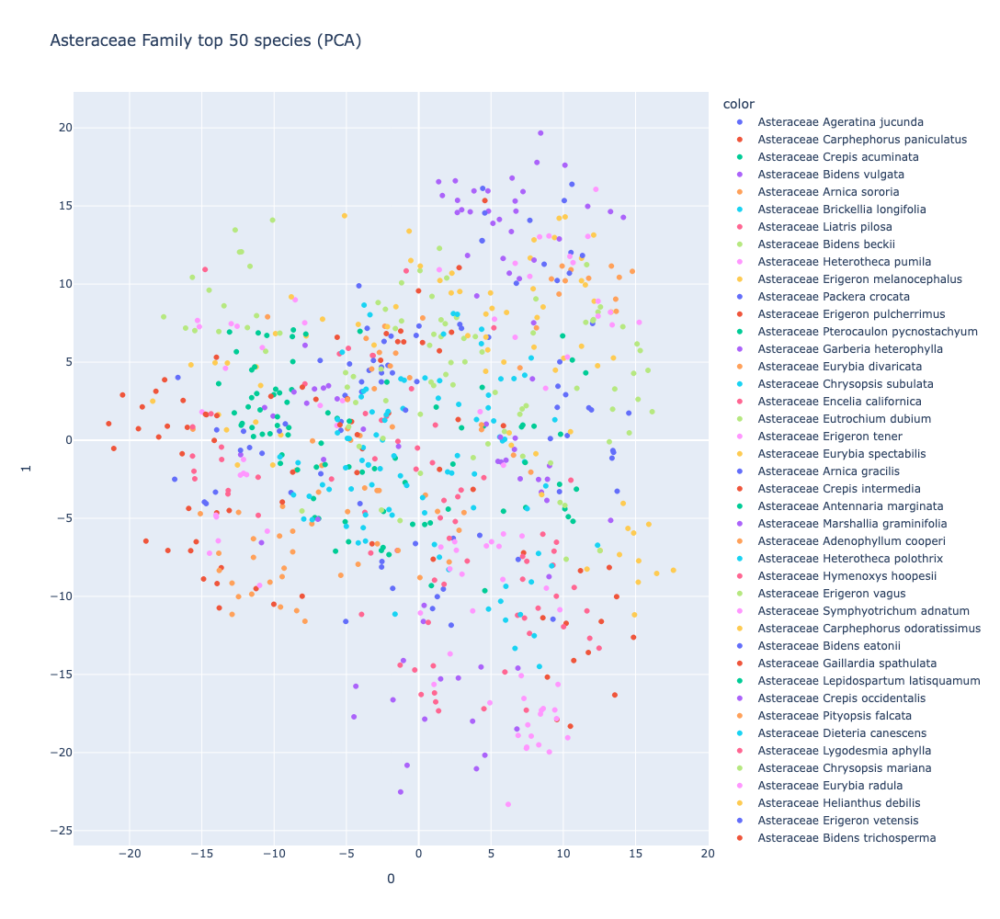

In [19]:
# change the colors to be discrete
fig_pca = px.scatter(features_2d, 
                 width=1000,
                 height=1000,
                 x=0, 
                 y=1, 
                 color=df_X_pca['label'],
                 title='Asteraceae Family top 50 species (PCA)')

fig_pca.show()

## Dimensionality Reduction - t-SNE

In [17]:
# dimensionality reduction using tsne 
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(features_matrix.squeeze())

In [18]:
df_X_tsne = pd.DataFrame(X_tsne, index=val_image_paths)
df_X_tsne['label'] = list(VAL_DICT.values())

df_X_tsne.head()

,0,1,label
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/002/97/00297__087.jpg,26.659443,13.447313,Asteraceae Ageratina jucunda
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/029/87/02987__096.jpg,18.514757,-18.575710,Asteraceae Carphephorus paniculatus
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/041/08/04108__021.jpg,-29.067924,-20.001364,Asteraceae Crepis acuminata
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/019/27/01927__007.jpg,9.639985,27.070469,Asteraceae Bidens vulgata
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/011/34/01134__013.jpg,4.252371,8.616837,Asteraceae Arnica sororia


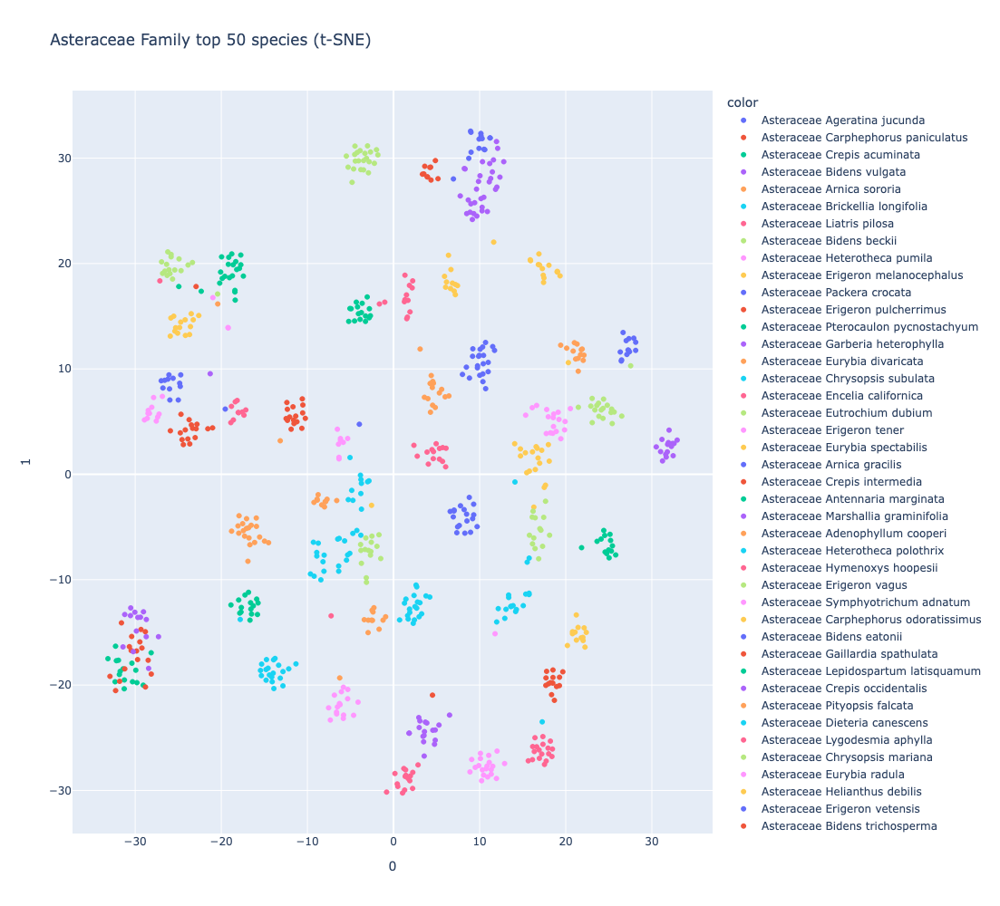

In [19]:
# shorten the image path for the display
paths = [s.split("/train_images")[-1] for s in df_X_tsne.index]
fig_tsne = px.scatter(X_tsne, 
                      width=1000,
                      height=1000,
                      x=0, 
                      y=1,
                      color=df_X_tsne['label'],
                      #hover_data=[df_X_tsne.index],
                      hover_data=[paths],
                      title='Asteraceae Family top 50 species (t-SNE)')

fig_tsne.show()

In [53]:
# save the figure as json file 
fig_tsne.write_json("asteraceae_tsne_plot_"+ "_".join(CHECKPOINT_PATH.split("/")[-2:]) + ".json")

In [22]:
df_X_tsne.to_csv("asteraceae_tsne_" + "_".join(CHECKPOINT_PATH.split("/")[-2:]) + ".csv")

# Plot Outliers

In [9]:
# plotting the outliers identified using PCA reduced data in the t-SNE space
# input is tsne reduced output with outlier column identified from pca reduced data
df_outliers = pd.read_csv("tsne_with_pca_10_outliers_maha_95th.csv") 
df_outliers["marker"] = df_outliers["outlier"].map({True: "cross-thin",
                                                    False: "square"})
symbol_map = {True: "cross-thin",
              False: "square"}

In [10]:
df_outliers.head()

,Unnamed: 0,0,1,label,outlier,marker
0,/projectnb/herbdl/data/kaggle-herbaria/herbari...,26.659443,13.447313,Asteraceae Ageratina jucunda,False,square
1,/projectnb/herbdl/data/kaggle-herbaria/herbari...,18.514757,-18.575710,Asteraceae Carphephorus paniculatus,False,square
2,/projectnb/herbdl/data/kaggle-herbaria/herbari...,-29.067924,-20.001364,Asteraceae Crepis acuminata,False,square
3,/projectnb/herbdl/data/kaggle-herbaria/herbari...,9.639985,27.070469,Asteraceae Bidens vulgata,True,cross-thin
4,/projectnb/herbdl/data/kaggle-herbaria/herbari...,4.252371,8.616837,Asteraceae Arnica sororia,True,cross-thin


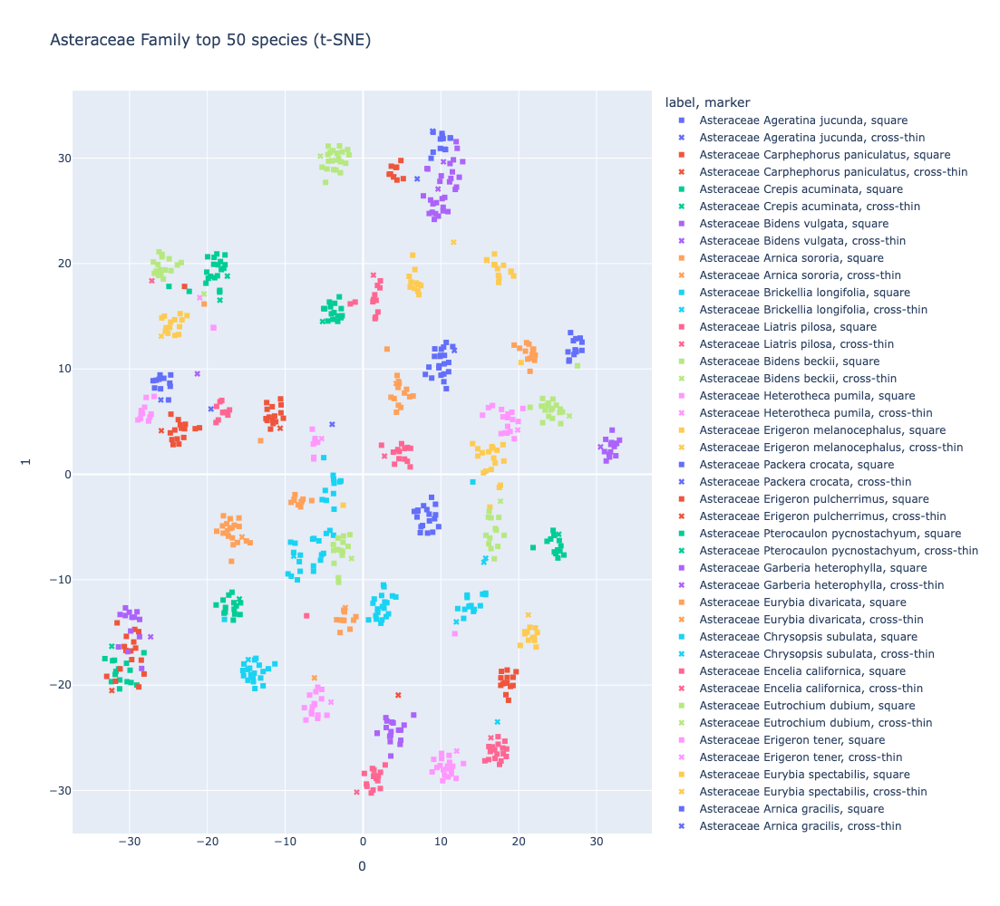

In [11]:
# configure plot
paths = [s.split("/train_images")[-1] for s in df_outliers["Unnamed: 0"]]
fig_outliers = px.scatter(df_outliers, 
                          width=1000,
                          height=1000,
                          x='0', 
                          y='1',
                          color='label',
                          symbol='marker',
                          symbol_map=symbol_map,
                          hover_data=[paths],
                          title='Asteraceae Family top 50 species (t-SNE)')

fig_outliers.show()

In [17]:
# save the figure as json file for visualization 
fig_outliers.write_json("asteraceae_outliers_10_95th"+ "_".join(CHECKPOINT_PATH.split("/")[-2:]) + ".json")